# Substitution patterns around hotspots

In [1]:
import os
from scipy import signal, stats
import numpy as np

# os.environ["MODIN_ENGINE"] = "ray"  # Modin will use Ray
# import modin.pandas as pd
import pandas as pd
from scipy.special import logit

import bisect
import importlib
import warnings
from pathlib import Path
import gc

from tqdm.notebook import trange, tqdm

import ete3
np.random.seed(7)

# import psutil, os
# def mem():
#     return psutil.Process(os.getpid()).memory_info().rss / 1024**3

Plotting setup:

In [2]:
%matplotlib inline

# Make inline plots vector graphics instead of raster graphics
from matplotlib_inline.backend_inline import set_matplotlib_formats
#set_matplotlib_formats('pdf', 'svg')
set_matplotlib_formats('retina', 'png')

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Rectangle
from matplotlib.lines import Line2D
from matplotlib import gridspec

#matplotlib.rcParams['figure.figsize'] = (20.0, 10.0)

# import mpld3

import seaborn as sns
sns.set() # sets seaborn default "prettyness:
sns.set_style("white")
sns.set_context("notebook")

# lowess for plotting
from statsmodels.nonparametric.smoothers_lowess import lowess

# My own paired palette replacing the last brown pair with violets
sns.color_palette('Paired').as_hex()
Paired = sns.color_palette(['#a6cee3', '#1f78b4', '#b2df8a', '#33a02c', '#fb9a99', '#e31a1c',
                            '#fdbf6f', '#ff7f00', '#cab2d6','#6a3d9a', '#e585cf', '#ad009d'])
#sns.palplot(Paired)

from shared_vars_and_func import *

Monospace font for numbers in tables:

In [3]:
%%html
<style> table { font-variant-numeric: tabular-nums; } </style>

# Load species details

In [4]:
species_details = pd.read_csv('/home/kmt/Birds/faststorage/data/species_details.txt', sep='\t')
species_details.head()

,species2014,species,english,latin,group,family,male_min,male_max,female_min,female_max,weight,order,order2014,branch_length
0,PICPU,PICPU,Downy Woodpecker,Picoides pubescens,woodpecker,woodpeckers,"20,70","32,20","20,70","32,20","26,45",39,1,0.143370
1,MERNU,MERNU,Carmine Bee-eater,Merops nubicus,woodpecker,bee-eaters,"34,00","59,00","34,00","59,00","46,5",38,2,0.102957
2,BUCRH,BUCRH,Rhinoceros Hornbill,Buceros rhinoceros,woodpecker,hornbills,"2465,00","2960,00","2040,00","2330,00","2448,75",37,3,0.099782
3,APAVI,APAVI,Bar-tailed Trogon,Apaloderma vittatum,woodpecker,trogons,"55,00","55,00","55,00","55,00",55,36,4,0.104832
4,LEPDI,LEPDI,Cuckoo Roller,Leptosomus discolor,woodpecker,cockoo-roller,"160,00","301,00","160,00","301,00","230,5",35,5,0.066956


# Overlaps to replication orgins

## Strand bias in substitution rates

For now just the rA2G and rT2C rates divided by their sum.

In [5]:
rate_table = pd.read_hdf('../results/rate_table.h5')

In [6]:
plot_df = rate_table[['rA2G', 'rT2C']].assign(rA2G_norm=lambda df: df.rA2G/(df.rA2G + df.rT2C),
                                              rT2C_norm=lambda df: df.rT2C/(df.rA2G + df.rT2C))
plot_df = plot_df[['rA2G_norm', 'rT2C_norm']].reset_index().melt(id_vars=['species', 'species_code', 'bin'])

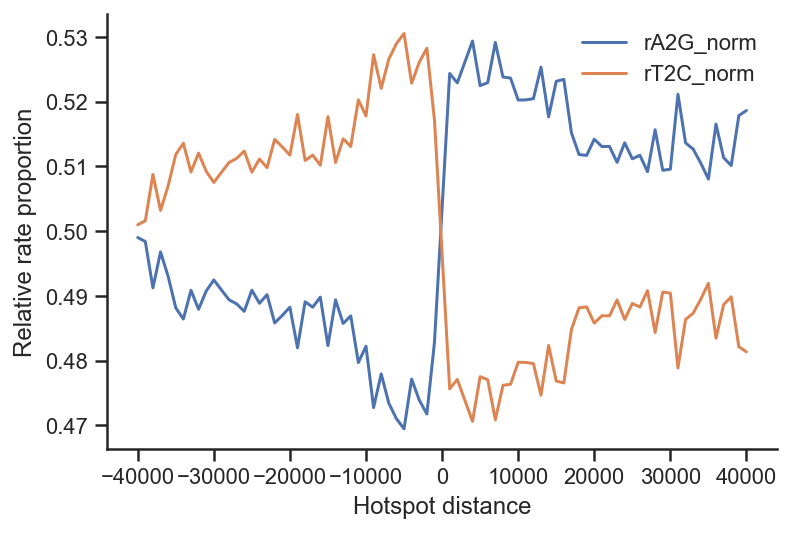

In [8]:
with sns.axes_style('ticks'):
    ax = sns.lineplot(x='bin', y='value', hue='variable', ci=None, data=plot_df.loc[plot_df.species == 'Zebra Finch'])
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    sns.despine()
#     plt.axvline(0, linestyle='dashed')
    plt.legend(frameon=False)
    plt.xlabel('Hotspot distance')
    plt.ylabel('Relative rate proportion')    
    plt.savefig(figures_path / 'origin_AG_TC_zebra_finch.pdf')                                                    

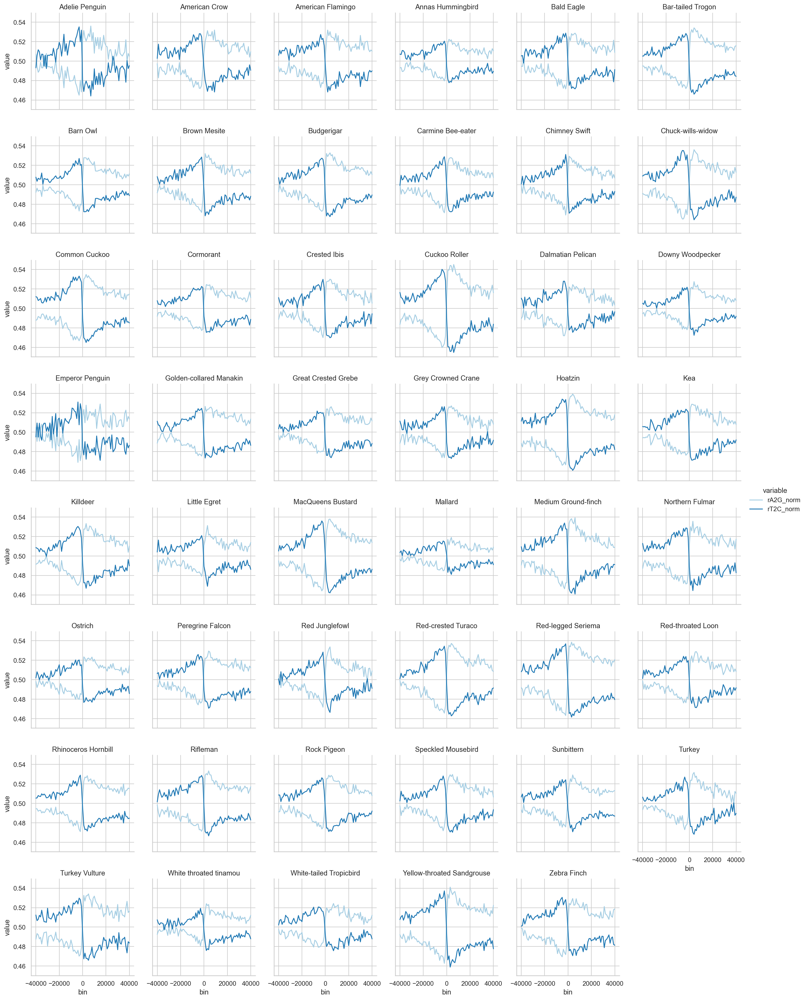

In [9]:
with sns.axes_style('whitegrid'):
    with sns.color_palette("Paired"):
        g = sns.FacetGrid(plot_df,
                          col='species', hue='variable',
                          col_wrap=6, sharey=True)
        g = g.map(sns.lineplot, 'bin', 'value', ci=None).add_legend()
        g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;
        plt.savefig(figures_path / 'origin_AG_TC_indiv_species.pdf')                                                            

## S-jumps

In the plots above, the `rA2G` and `rT2C` are symmetric on each side. So it is maybe not the most sensible way to plot it. Here we plot their difference instead:


In [10]:
plot_df = (rate_table[['rT2G-rA2C', 'rA2G-rT2C', 'rA2T-rT2A',
                       'rG2T-rC2A', 'rC2G-rG2C', 'rC2T-rG2A']]
           .reset_index()
           .melt(id_vars=['species', 'species_code', 'bin'], value_name='rate')
          )
plot_df.head()

,species,species_code,bin,variable,rate
0,Adelie Penguin,PYGAD,-40000.0,rT2G-rA2C,0.003353
1,Adelie Penguin,PYGAD,-39000.0,rT2G-rA2C,-0.001803
2,Adelie Penguin,PYGAD,-38000.0,rT2G-rA2C,-0.001464
3,Adelie Penguin,PYGAD,-37000.0,rT2G-rA2C,0.004803
4,Adelie Penguin,PYGAD,-36000.0,rT2G-rA2C,-0.003183


In [11]:
plot_df.loc[plot_df.species.isin(example_species)]

,species,species_code,bin,variable,rate
162,American Flamingo,PHORU,-40000.0,rT2G-rA2C,0.004528
163,American Flamingo,PHORU,-39000.0,rT2G-rA2C,-0.008965
164,American Flamingo,PHORU,-38000.0,rT2G-rA2C,-0.002864
165,American Flamingo,PHORU,-37000.0,rT2G-rA2C,0.001962
166,American Flamingo,PHORU,-36000.0,rT2G-rA2C,-0.002794
...,...,...,...,...,...
22837,Zebra Finch,TAEGU,36000.0,rC2T-rG2A,0.021828
22838,Zebra Finch,TAEGU,37000.0,rC2T-rG2A,-0.015327
22839,Zebra Finch,TAEGU,38000.0,rC2T-rG2A,0.012944
22840,Zebra Finch,TAEGU,39000.0,rC2T-rG2A,0.000640


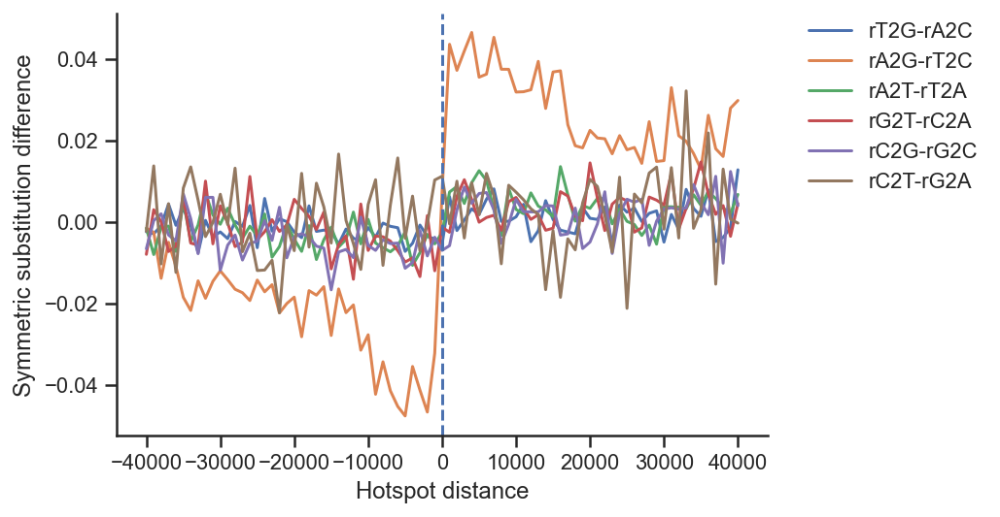

In [12]:
species = 'TAEGU'
with sns.axes_style('ticks'):
    ax = sns.lineplot(x='bin', y='rate', hue='variable', ci=None, data=plot_df.loc[plot_df.species_code == species])
    sns.despine()
    plt.axvline(0, linestyle='dashed')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., frameon=False)
    # plt.title(species)
    plt.xlabel('Hotspot distance')
    plt.ylabel('Symmetric substitution difference')
    plt.savefig(figures_path / 'sjumps_all_rates_avg_over_species.pdf')                                                    

Same plot for each species:

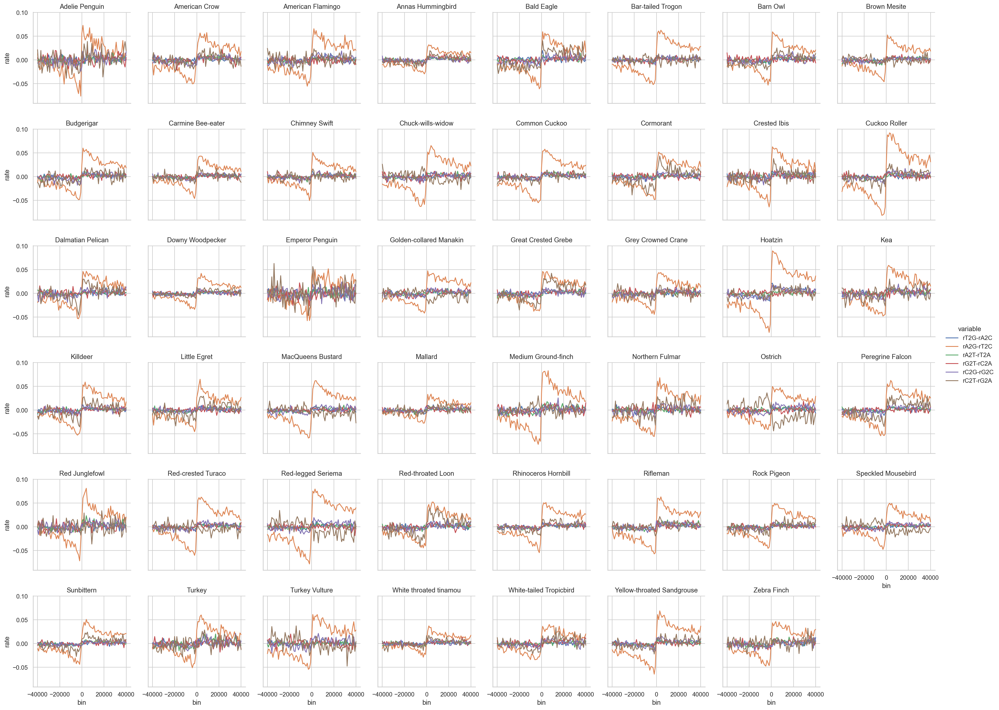

In [13]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(plot_df,
                      col='species', hue='variable',
                      col_wrap=8, sharey=True)
    g = g.map(sns.lineplot, 'bin', 'rate').add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;
    plt.savefig(figures_path / 'sjumps_all_rates_indiv_species.pdf')                                                        

The `rT2C-A2G` pattern is by far the strongest, but if the other patterns are plotted on separate scales there is a clear bias there too:

Looking more closely on the strongest pattern `rA2G-rT2C` in Bald Eagle (that srongly share hotspots) and Downy Woodpecker and Ostrich (that do not), we see that these species seem to use the locations as replication origins to the same extent. That suggests that there the use of locations as hotspots is not tied to the use as replication origins.

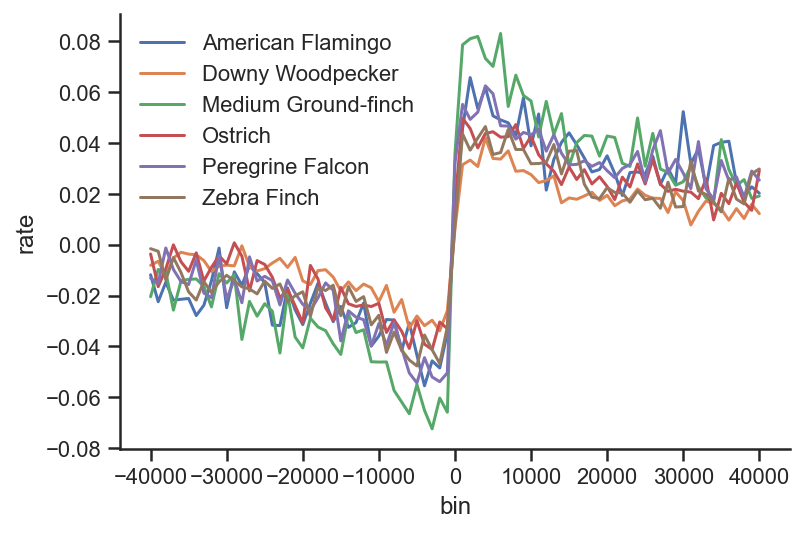

In [14]:
plot_df_subset = plot_df.loc[plot_df.species.isin(example_species) & (plot_df.variable == 'rA2G-rT2C')].copy()
# plot_df_subset.species.cat.remove_unused_categories(inplace=True)
plot_df_subset['species'] = plot_df_subset['species'].cat.remove_unused_categories()

with sns.axes_style('ticks'):
    sns.lineplot(x='bin', y='rate', hue='species', ci=None, data=plot_df_subset)
    sns.despine()
#    plt.axvline(x=0, linestyle='dashed')
    plt.legend(#bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., 
               frameon=False, title='')

    ax = plt.gca()
    legend = ax.legend(frameon=False)
    # legend.texts[0].set_text("")
    plt.savefig(figures_path / 'poster_sjumps_AG_TC_eagle_woodpecker_ostrich_zebrafinch.pdf')                                                            

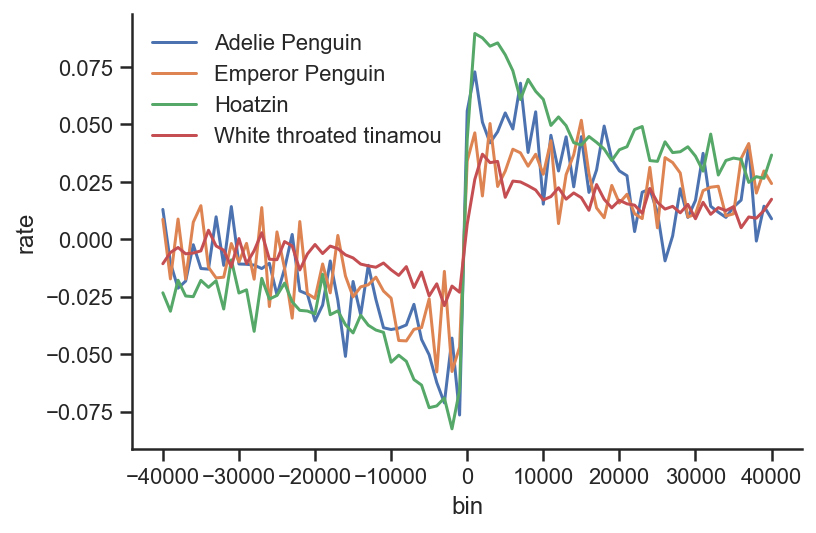

In [15]:
species = ['Hoatzin', 'White throated tinamou', 'Adelie Penguin', 'Emperor Penguin']
plot_df_subset = plot_df.loc[plot_df.species.isin(species) & (plot_df.variable == 'rA2G-rT2C')].copy()
# plot_df_subset.species.cat.remove_unused_categories(inplace=True)
plot_df_subset['species'] = plot_df_subset['species'].cat.remove_unused_categories()

with sns.axes_style('ticks'):
    sns.lineplot(x='bin', y='rate', hue='species', ci=None, data=plot_df_subset)
    sns.despine()
#    plt.axvline(x=0, linestyle='dashed')
    plt.legend(#bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., 
               frameon=False)
    
    ax = plt.gca()
    legend = ax.legend(frameon=False)
#    legend.texts[0].set_text("")
    plt.savefig(figures_path / 'sjumps_all_rates_penguins_hoatzin_tinamou.pdf')                                                        

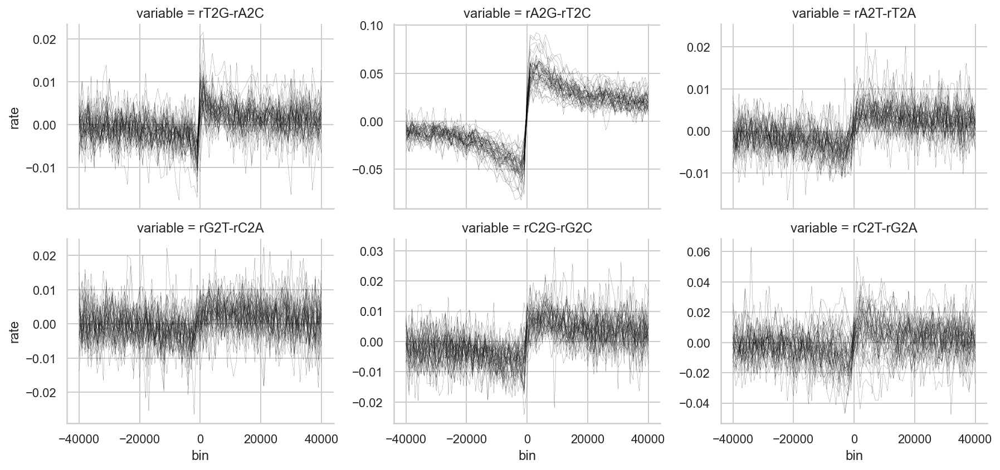

In [16]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(plot_df,
                      col='variable', hue='species',
                      col_wrap=3, sharey=False, aspect=1.4)
    g = g.map(sns.lineplot, 'bin', 'rate', linewidth=0.1, color='black')
    plt.savefig(figures_path / 'sjumps_all_species_each_paired_rate.pdf')                                                        

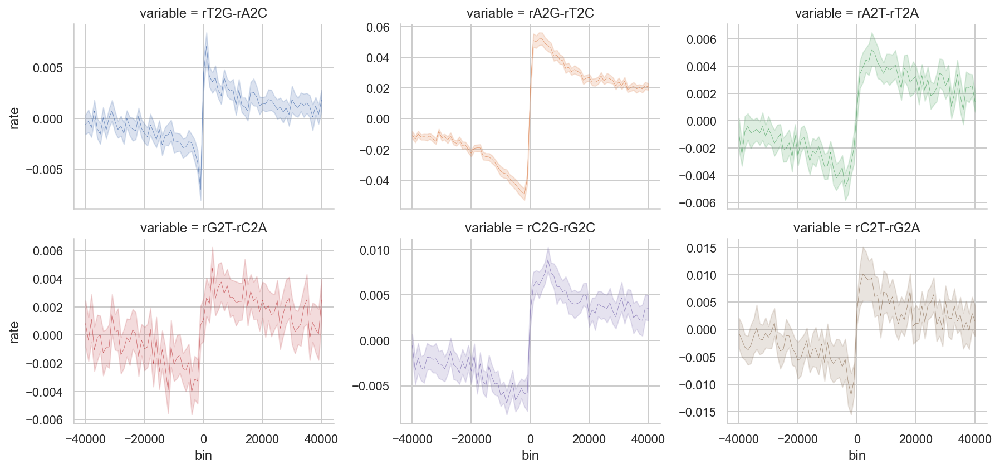

In [17]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(plot_df,
                      col='variable',
                      col_wrap=3, sharey=False, aspect=1.4, hue='variable')
    g = g.map(sns.lineplot, 'bin', 'rate', linewidth=0.3)
    plt.savefig(figures_path / 'sjumps_mean_each_paired_rate.pdf')                                                            

---

## S-jumps for CGI and non-CGI hotspots separately

In [18]:
subst_data = pd.read_hdf('../results/subst_data.h5')
hotspot_anno_dist = pd.read_hdf('../results/hotspot_anno_dist.h5')

In [19]:
df = (subst_data
      .merge(hotspot_anno_dist[['hotspot_center', 'dist_cgi']], 
             on='hotspot_center')
      .assign(cgi_overlapping=lambda df: df.dist_cgi==0)
     )

table = pd.pivot_table(df, index=['species', 'species_code', 'bin', 'cgi_overlapping'], 
                    columns='pattern', values='rate')
table.columns = table.columns.astype('str')
for a, b in paired_patterns:
    table[f'{a}-{b}'] = table[a] - table[b]

plot_df = (table[['rT2G-rA2C', 'rA2G-rT2C', 'rA2T-rT2A',
                       'rG2T-rC2A', 'rC2G-rG2C', 'rC2T-rG2A']]
           .reset_index()
           .melt(id_vars=['species', 'species_code', 'bin', 'cgi_overlapping'], value_name='rate')
          )

Same plot but for only hotspots overlapping CGIs:

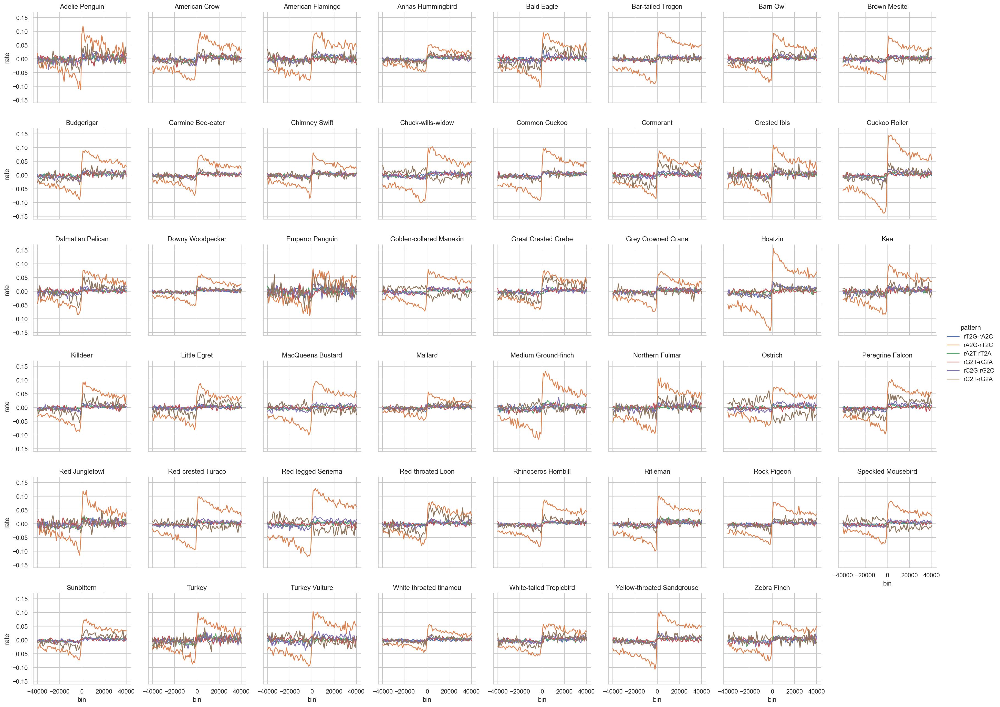

In [20]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(plot_df.loc[plot_df.cgi_overlapping],
                      col='species', hue='pattern',
                      col_wrap=8, sharey=True)
    g = g.map(sns.lineplot, 'bin', 'rate').add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;
    plt.savefig(figures_path / 'sjumps_all_rates_cgi_indiv_species.pdf')                                                            

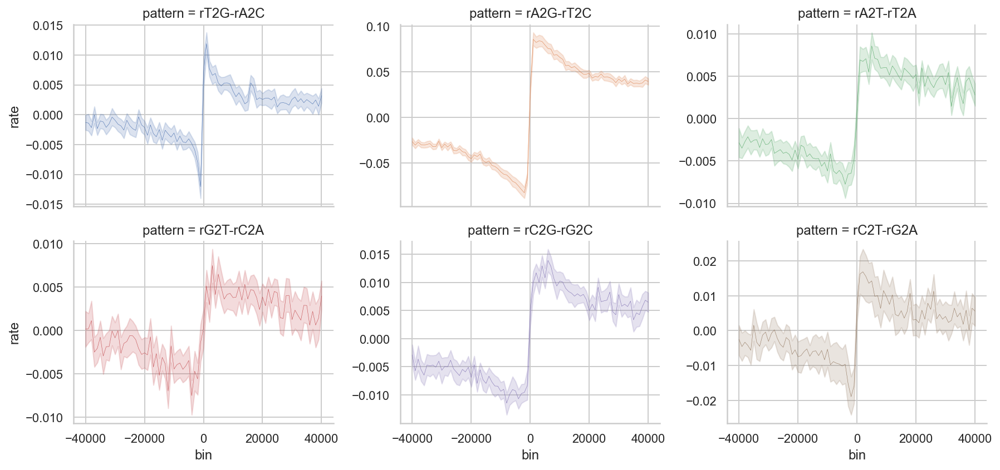

In [21]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(plot_df.loc[plot_df.cgi_overlapping],
                      col='pattern',
                      col_wrap=3, sharey=False, aspect=1.4, hue='pattern')
    g = g.map(sns.lineplot, 'bin', 'rate', linewidth=0.3)
    plt.savefig(figures_path / 'sjumps_mean_each_paired_rate_cgi.pdf') 

Same plot but for only hotspots *not* overlapping CGIs:

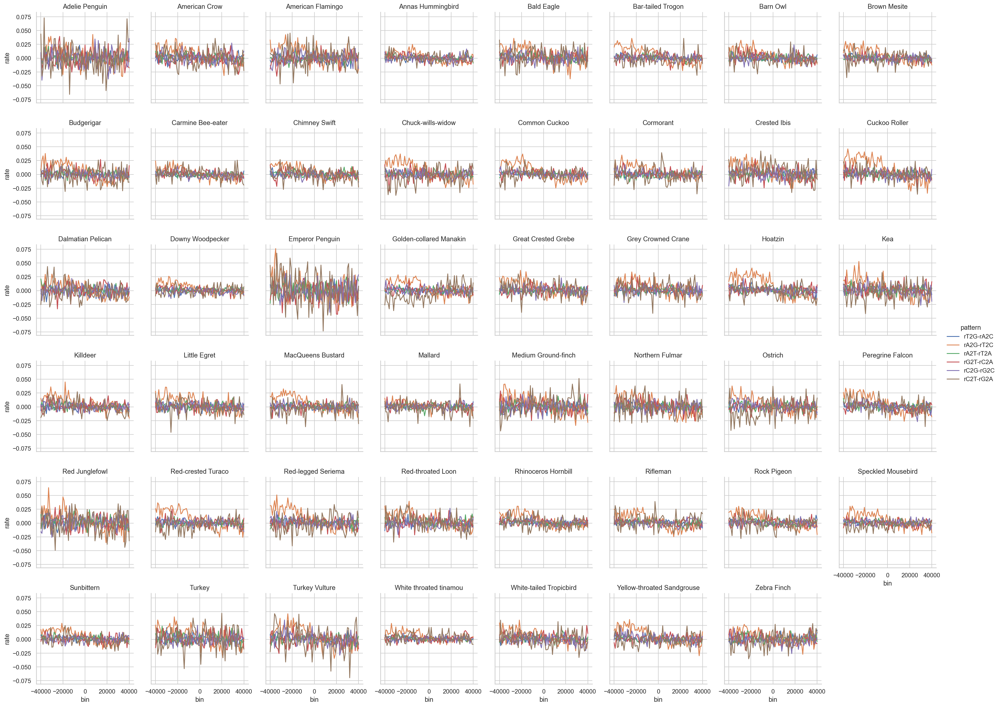

In [22]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(plot_df.loc[~plot_df.cgi_overlapping],
                      col='species', hue='pattern',
                      col_wrap=8, sharey=True)
    g = g.map(sns.lineplot, 'bin', 'rate').add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;
    plt.savefig(figures_path / 'sjumps_all_rates_non-cgi_indiv_species.pdf')                                                                

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


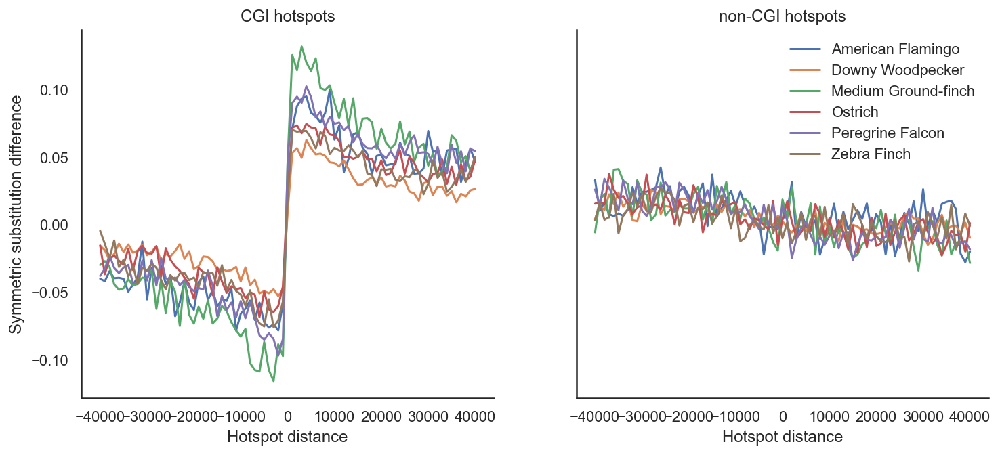

In [23]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

plot_df_subset = plot_df.loc[plot_df.cgi_overlapping & plot_df.species.isin(example_species) & (plot_df.pattern == 'rA2G-rT2C')].copy()
# plot_df_subset.species.cat.remove_unused_categories(inplace=True)
plot_df_subset['species'] = plot_df_subset['species'].cat.remove_unused_categories()

with sns.axes_style('ticks'):
    sns.lineplot(x='bin', y='rate', hue='species', ci=None, data=plot_df_subset, ax=ax1, legend=False)
    sns.despine()
#    plt.axvline(x=0, linestyle='dashed')
    # plt.legend(#bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., 
    #            frameon=False, title='')

    ax = plt.gca()
    legend = ax.legend(frameon=False)
    ax1.set_title('CGI hotspots')    
    ax1.set_xlabel('Hotspot distance')
    ax1.set_ylabel('Symmetric substitution difference')     
    # legend.texts[0].set_text("")
#    plt.savefig(figures_path / 'poster_cgi_sjumps_AG_TC_eagle_woodpecker_ostrich_zebrafinch.pdf') 

plot_df_subset = plot_df.loc[~plot_df.cgi_overlapping & plot_df.species.isin(example_species) & (plot_df.pattern == 'rA2G-rT2C')].copy()
# plot_df_subset.species.cat.remove_unused_categories(inplace=True)
plot_df_subset['species'] = plot_df_subset['species'].cat.remove_unused_categories()

with sns.axes_style('ticks'):
    sns.lineplot(x='bin', y='rate', hue='species', ci=None, data=plot_df_subset, ax=ax2)
    sns.despine()
#    plt.axvline(x=0, linestyle='dashed')
    plt.legend(#bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., 
               frameon=False, title='')

    ax = plt.gca()
    legend = ax.legend(frameon=False)
    ax2.set_title('non-CGI hotspots')
    ax2.set_xlabel('Hotspot distance')
    ax2.set_ylabel('Symmetric substitution difference')    
    # legend.texts[0].set_text("")
    plt.savefig(figures_path / 'poster_non-cgi_sjumps_AG_TC_eagle_woodpecker_ostrich_zebrafinch.pdf')  

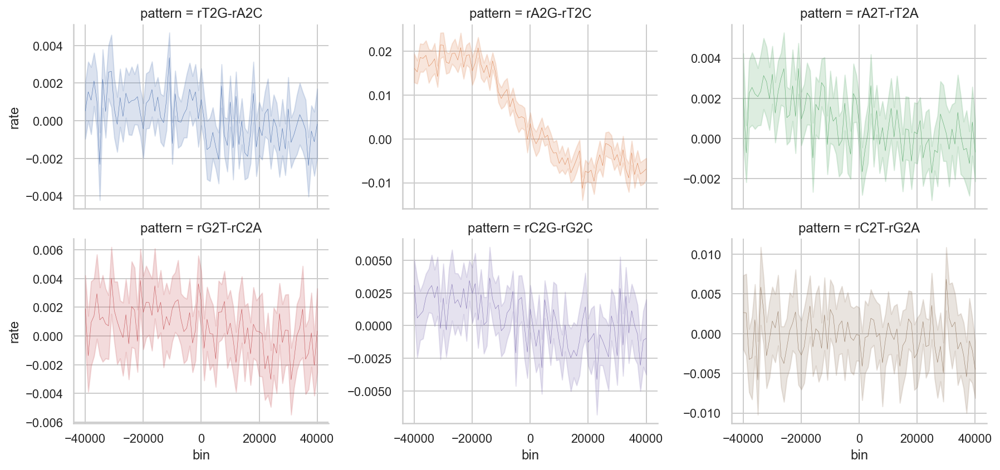

In [24]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(plot_df.loc[~plot_df.cgi_overlapping],
                      col='pattern',
                      col_wrap=3, sharey=False, aspect=1.4, hue='pattern')
    g = g.map(sns.lineplot, 'bin', 'rate', linewidth=0.3)
    plt.savefig(figures_path / 'sjumps_mean_each_paired_rate_non-cgi.pdf') 

# Is the oposite signal in non-CPGs evidence that these are "recovering" from being replication origins before?

**The `rA2G-T2C` pattern could be hotspots close to (but not overlapping CGIs). If origins are at the CGIs, then non-CGI hotspots distributed around them, would give a protracted s-jump**

**It looks like it is the mainly CGI hotspots that are at origins...**

# Hotspot strength and integrated bias

In [25]:
integrated_bias = pd.read_hdf('../results/integrated_bias.hdf')
integrated_bias.head()

,species,species_code,hotspot_center,pattern,total_bias
0,Adelie Penguin,PYGAD,86463,rA2G-rT2C,-15698.468983
1,Adelie Penguin,PYGAD,86463,rA2T-rT2A,-17280.334681
2,Adelie Penguin,PYGAD,86463,rC2G-rG2C,-22930.407435
3,Adelie Penguin,PYGAD,86463,rC2T-rG2A,-11752.007544
4,Adelie Penguin,PYGAD,86463,rG2T-rC2A,-18759.818777


In [26]:
hotspot_anno_dist = pd.read_hdf('../results/hotspot_anno_dist.h5')
hotspot_anno_dist.head()

,chrom,bin_cgi,hotspot_center,dist_cgi,bin_tss,dist_tss,bin_tes,dist_tes,bin_promoter,dist_promoter
1085,1,0.0,6894116,0,56000.0,55690,31000.0,31212,56000.0,56190
147,1,0.0,8805005,0,-459000.0,458971,430000.0,429995,-459000.0,458721
2331,1,14000.0,9687030,14220,423000.0,422594,-496000.0,495556,423000.0,423094
748,1,2000.0,10397061,2419,3000.0,2935,2000.0,2063,3000.0,3435
1650,1,0.0,10503751,0,0.0,0,0.0,0,0.0,0


In [27]:
one_percent_gcstar_quantiles = pd.read_hdf('../results/one_percent_gcstar_quantiles.h5')
one_percent_gcstar_quantiles.head()

,species,species_code,GCstar_mut
0,Downy Woodpecker,PICPU,0.303483
1,Carmine Bee-eater,MERNU,0.295427
2,Rhinoceros Hornbill,BUCRH,0.338145
3,Bar-tailed Trogon,APAVI,0.290873
4,Cuckoo Roller,LEPDI,0.316841


In [28]:
intgr_bias = integrated_bias.loc[integrated_bias.pattern == 'rA2G-rT2C'].merge(hotspot_anno_dist, on='hotspot_center')
intgr_bias['cgi_annot'] = 'non-CGI'
intgr_bias.loc[intgr_bias.dist_cgi == 0, 'cgi_annot'] = 'CGI'
intgr_bias = intgr_bias[['species', 'species_code', 'hotspot_center', 'pattern', 'total_bias', 'cgi_annot']]

## By species

In [29]:
intgr_bias_by_species_and_annot = intgr_bias.groupby(['species', 'cgi_annot']).mean(numeric_only=True).reset_index()[['species', 'cgi_annot', 'total_bias']]
intgr_bias_by_species_and_annot.head()

,species,cgi_annot,total_bias
0,Adelie Penguin,CGI,3374.966995
1,Adelie Penguin,non-CGI,-555.220265
2,American Crow,CGI,3755.109031
3,American Crow,non-CGI,-953.119383
4,American Flamingo,CGI,3919.084318


In [30]:
hotspot_data_subs = pd.read_hdf('../results/hotspot_data.h5')[['bin', 'chrom', 'hotspot_center', 'species', 'species_code', 
       'rA2C', 'rA2G', 'rA2T', 'rC2A', 'rC2G', 'rC2T', 'rG2A', 'rG2C', 'rG2T', 'rT2A', 'rT2C', 'rT2G']]
hotspot_data_subs = hotspot_data_subs.loc[(hotspot_data_subs.bin == 0) | ((hotspot_data_subs.bin.abs() >= 20000) & (hotspot_data_subs.bin.abs() < 40000))]
hotspot_data_subs.head()

,bin,chrom,hotspot_center,species,species_code,rA2C,rA2G,rA2T,rC2A,rC2G,rC2T,rG2A,rG2C,rG2T,rT2A,rT2C,rT2G
0,0.0,1,6894116,American Crow,CORBR,0.020408,0.030612,0.010204,0.000000,0.000000,0.043956,0.008547,0.000000,0.017094,0.009709,0.019417,0.009709
1,0.0,1,8805005,American Crow,CORBR,0.003390,0.020339,0.006780,0.012739,0.000000,0.006369,0.017045,0.000000,0.017045,0.014760,0.014760,0.007380
2,0.0,1,9687030,American Crow,CORBR,0.006873,0.013746,0.003436,0.005208,0.010417,0.010417,0.019048,0.000000,0.019048,0.006711,0.006711,0.006711
3,0.0,1,10397061,American Crow,CORBR,0.011494,0.022989,0.007663,0.009804,0.000000,0.019608,0.048193,0.006024,0.006024,0.003610,0.028881,0.000000
4,0.0,1,10503751,American Crow,CORBR,0.000000,0.009174,0.018349,0.006289,0.000000,0.012579,0.025316,0.018987,0.012658,0.014085,0.014085,0.007042


In [31]:
df = hotspot_data_subs.merge(hotspot_anno_dist[['hotspot_center', 'dist_cgi']], on='hotspot_center', how='left')
df['cgi_annot'] = 'non-CGI'
df.loc[df.dist_cgi == 0, 'cgi_annot'] = 'CGI'
df['pos'] = 'flank'
df.loc[df.bin == 0, 'pos'] = 'center'
df = df.groupby(['species', 'cgi_annot', 'pos']).mean(numeric_only=True)
df['GCflux'] = (df.rA2G + df.rA2C + df.rT2G + df.rT2C) / \
             (df.rC2A + df.rC2T + df.rG2A + df.rG2T)
df['GCstar'] = df.GCflux/(1 + df.GCflux)
df = df[['GCstar']].reset_index()
df = pd.pivot_table(df, index=['species', 'cgi_annot'], columns='pos', values='GCstar').reset_index().merge(one_percent_gcstar_quantiles, on='species')

df['hotspot_strength'] = \
    (logit(df.center) - logit(df.GCstar_mut)) / \
    (logit(df.flank) - logit(df.GCstar_mut))
df['log_hotspot_strength'] = np.log2(df['hotspot_strength'])

species_strength_vs_bias = df.merge(intgr_bias_by_species_and_annot)[['species', 'species_code', 'cgi_annot', 'hotspot_strength', 'log_hotspot_strength', 'total_bias']]
species_strength_vs_bias = species_strength_vs_bias.loc[df.species_code != 'TAEGU']
species_strength_vs_bias.head()

,species,species_code,cgi_annot,hotspot_strength,log_hotspot_strength,total_bias
0,Adelie Penguin,PYGAD,CGI,2.247184,1.168118,3374.966995
1,Adelie Penguin,PYGAD,non-CGI,1.330325,0.411779,-555.220265
2,American Crow,CORBR,CGI,2.192705,1.132712,3755.109031
3,American Crow,CORBR,non-CGI,1.699311,0.764950,-953.119383
4,American Flamingo,PHORU,CGI,2.090552,1.063884,3919.084318


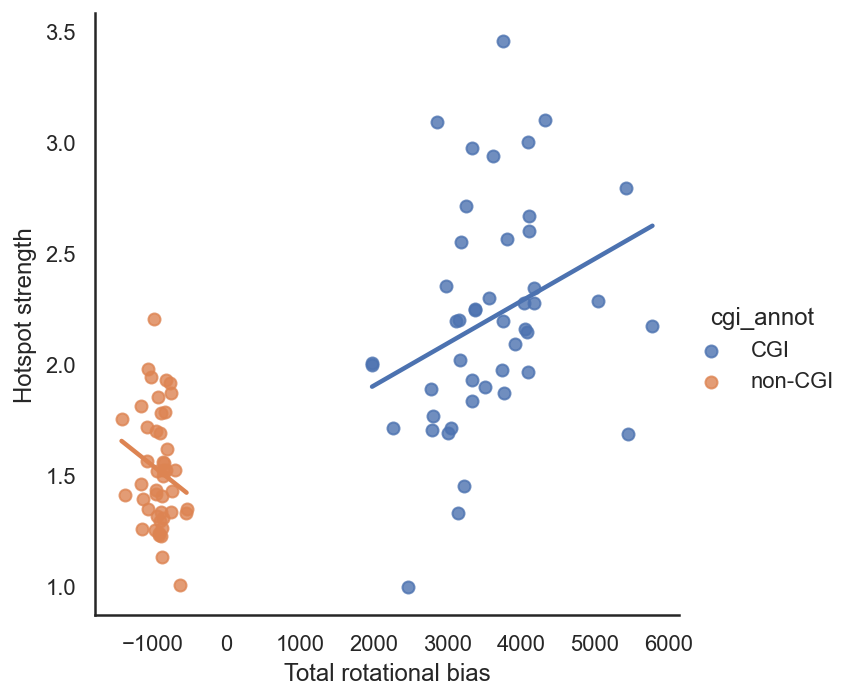

In [34]:
g = sns.lmplot(data=species_strength_vs_bias, x="total_bias", y="hotspot_strength", hue="cgi_annot", height=5, ci=None)
plt.ylabel('Hotspot strength')
plt.xlabel('Total rotational bias')
# g.legend.remove()
# g.fig.legend(handles=g.legend.legend_handles, loc=7, frameon=True)

plt.savefig(figures_path / 'poster_bias_strength_regression.pdf') 

In [2]:
from sklearn import datasets, linear_model
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from scipy import stats

X = species_strength_vs_bias.loc[(species_strength_vs_bias.cgi_annot == 'CGI'), 'hotspot_strength']
y = species_strength_vs_bias.loc[(species_strength_vs_bias.cgi_annot == 'CGI'), 'total_bias']
X2 = sm.add_constant(X)
est = sm.OLS(y, X2)
est2 = est.fit()
print(est2.summary())

ModuleNotFoundError: No module named 'sklearn'

Python 3.7.13


## By hotspot

In [ ]:
df = hotspot_data_subs.merge(hotspot_anno_dist[['hotspot_center', 'dist_cgi']], on='hotspot_center', how='left')
df['cgi_annot'] = 'non-CGI'
df.loc[df.dist_cgi == 0, 'cgi_annot'] = 'CGI'
df['pos'] = 'flank'
df.loc[df.bin == 0, 'pos'] = 'center'

df = df.groupby(['species', 'hotspot_center', 'cgi_annot', 'pos']).mean(numeric_only=True)
df['GCflux'] = (df.rA2G + df.rA2C + df.rT2G + df.rT2C) / \
             (df.rC2A + df.rC2T + df.rG2A + df.rG2T)
df['GCstar'] = df.GCflux/(1 + df.GCflux)
df = df[['GCstar']].reset_index()
df = pd.pivot_table(df, index=['species', 'hotspot_center', 'cgi_annot'], columns='pos', values='GCstar').reset_index().merge(one_percent_gcstar_quantiles, on='species')

df['hotspot_strength'] = \
    (logit(df.center) - logit(df.GCstar_mut)) / \
    (logit(df.flank) - logit(df.GCstar_mut))

species_hotspot_strength_vs_bias = df.merge(intgr_bias)[['species', 'species_code', 'cgi_annot', 'hotspot_center', 'hotspot_strength', 'total_bias']]
species_hotspot_strength_vs_bias.head()

In [ ]:
hotspot_means = (species_hotspot_strength_vs_bias.loc[species_hotspot_strength_vs_bias.species_code != 'TAEGU']
      .groupby(['hotspot_center', 'cgi_annot'])
      .mean(numeric_only=True)
      .reset_index()
     )
hotspot_means.head()

In [ ]:
sns.scatterplot(data=hotspot_means.loc[(hotspot_means.hotspot_strength > -10) & (hotspot_means.hotspot_strength < 10)], x='total_bias', y='hotspot_strength', hue='cgi_annot', alpha=0.5) ;

In [ ]:
# Show the joint distribution using kernel density estimation
g = sns.jointplot(
    data=hotspot_means.loc[(hotspot_means.hotspot_strength > -10) & (hotspot_means.hotspot_strength < 10)],
    x="total_bias", y="hotspot_strength", hue="cgi_annot",
    kind="kde",
)

In [ ]:
X = hotspot_means.loc[(hotspot_means.hotspot_strength > -10) & (hotspot_means.hotspot_strength < 10), 'hotspot_strength']
y = hotspot_means.loc[(hotspot_means.hotspot_strength > -10) & (hotspot_means.hotspot_strength < 10), 'total_bias']
X2 = sm.add_constant(X)
est = sm.OLS(y, X2)
est2 = est.fit()
print(est2.summary())

## Rolling means

In [ ]:
# df = (species_hotspot_strength_vs_bias.loc[species_hotspot_strength_vs_bias.cgi_annot == 'CGI']
#       .groupby(['hotspot_center'], observed=True)
#       .mean(numeric_only=True)
#       .reset_index()
#      .sort_values('total_bias')
#      .reset_index(drop=True)
#      )
# df['rank'] = df.index.values
# hotspot_ranks = df[['hotspot_center', 'rank']]
# hotspot_ranks.head()

### CGI

In [ ]:
df = species_hotspot_strength_vs_bias.loc[species_hotspot_strength_vs_bias.cgi_annot == 'CGI'].copy()
df['hotspot_mean_total_bias'] = (df
                                                                  .groupby(['hotspot_center'], observed=True)
                                                                  .total_bias
                                                                  .transform('mean')
     )

# df = df[['species', 'hotspot_center', 'hotspot_strength', 'total_bias']].pivot(index=['hotspot_center', 'hotspot_strength'], columns='species', values='hotspot_strength')
# df = df.sort_values('hotspot_strength', ascending=False)
df = df[['species', 'hotspot_center', 'hotspot_mean_total_bias', 'total_bias']].pivot(index=['hotspot_center', 'hotspot_mean_total_bias'], columns='species', values='total_bias')
df = df.sort_values('hotspot_mean_total_bias')

df = df.reset_index(drop=True)
df.index.name = 'rank'
df.head(10)

In [ ]:
# plot_df = df.rolling(100, min_periods=50).mean().stack().to_frame('hotspot_strength').reset_index()
plot_df_cgi = df.rolling(100, min_periods=50).mean().stack().to_frame('total_bias').reset_index()

### non-CGI

In [ ]:
df = species_hotspot_strength_vs_bias.loc[species_hotspot_strength_vs_bias.cgi_annot == 'non-CGI'].copy()
df['hotspot_mean_total_bias'] = (df
                                                                  .groupby(['hotspot_center'], observed=True)
                                                                  .total_bias
                                                                  .transform('mean')
     )

# df = df[['species', 'hotspot_center', 'hotspot_strength', 'total_bias']].pivot(index=['hotspot_center', 'hotspot_strength'], columns='species', values='hotspot_strength')
# df = df.sort_values('hotspot_strength', ascending=False)
df = df[['species', 'hotspot_center', 'hotspot_mean_total_bias', 'total_bias']].pivot(index=['hotspot_center', 'hotspot_mean_total_bias'], columns='species', values='total_bias')
df = df.sort_values('hotspot_mean_total_bias')

df = df.reset_index(drop=True)
df.index.name = 'rank'
df.head(10)

In [ ]:
# plot_df = df.rolling(100, min_periods=50).mean().stack().to_frame('hotspot_strength').reset_index()
plot_df_noncgi = df.rolling(100, min_periods=50).mean().stack().to_frame('total_bias').reset_index()

### plot

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(12, 7))
plot_df_cgi['rank_norm'] = plot_df_cgi['rank'] / plot_df_cgi.index.size
plot_df_noncgi['rank_norm'] = plot_df_noncgi['rank'] / plot_df_noncgi.index.size
sns.lineplot(data=plot_df_cgi, x="rank_norm", y="total_bias", hue="species", linewidth=0.5, ax=ax, legend=False) ; 
sns.lineplot(data=plot_df_noncgi, x="rank_norm", y="total_bias", hue="species", linewidth=0.5, ax=ax, legend=False) ; 


In [ ]:
plt.figure(figsize=(12, 7))
# sns.lineplot(data=plot_df, x="rank", y="hotspot_strength", hue="species", linewidth=1, legend=False) ; 
sns.lineplot(data=plot_df_cgi, x="rank", y="total_bias", hue="species", linewidth=0.5, legend=False) ; 
#plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0) ;

In [ ]:
plt.figure(figsize=(12, 7))
# sns.lineplot(data=plot_df, x="rank", y="hotspot_strength", hue="species", linewidth=1, legend=False) ; 
sns.lineplot(data=plot_df_noncgi, x="rank", y="total_bias", hue="species", linewidth=0.5, legend=False) ; 
#plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0) ;

In [33]:
y = df.total_bias.rolling(100).mean()
x = list(range(len(y)))
plt.plot(x, y)

AttributeError: 'DataFrame' object has no attribute 'total_bias'

In [79]:
df['ori_annot'] = 'ORI'
df.loc[(df.total_bias < 0), 'ori_annot'] = 'non-ORI'
df['hot_annot'] = 'HOT'
df.loc[(df.hotspot_strength < -1000), 'hot_annot'] = 'non-HOT'
df

,hotspot_center,cgi_annot,hotspot_strength,total_bias,ori_annot,hot_annot
1607,46302093,non-CGI,NaN,-935.733430,non-ORI,HOT
2324,80451005,non-CGI,0.555720,-929.723748,non-ORI,HOT
690,21131636,non-CGI,NaN,-924.485836,non-ORI,HOT
197,9882726,non-CGI,NaN,-924.485836,non-ORI,HOT
92,6897028,non-CGI,-4.552281,-922.836972,non-ORI,HOT
...,...,...,...,...,...,...
812,23689458,CGI,1.668376,3857.396701,ORI,HOT
145,8141004,CGI,0.763073,3870.255286,ORI,HOT
1179,32930501,CGI,NaN,4013.698380,ORI,HOT
2416,88427067,CGI,NaN,4073.508462,ORI,HOT


In [83]:
df.groupby(['cgi_annot', 'ori_annot']).size()

cgi_annot  ori_annot
CGI        ORI          1785
non-CGI    non-ORI      1071
dtype: int64

In [84]:
df.groupby(['cgi_annot', 'hot_annot', 'ori_annot']).size()

cgi_annot  hot_annot  ori_annot
CGI        HOT        ORI          1780
           non-HOT    ORI             5
non-CGI    HOT        non-ORI      1067
           non-HOT    non-ORI         4
dtype: int64

## Compute area under bias curves (total bias)

To quantify the total bias +/- 40000bp around the hotspot, we compute the area under the curve. I.e. the summed diviation from 0.5:

In [ ]:
# def get_abs_area(df):
#     left = np.trapz(0.5-df.loc[df.bin <= 0].rate, x=df.loc[df.bin <= 0].bin)
#     right = np.trapz(df.loc[df.bin >= 0].rate-0.5, x=df.loc[df.bin >= 0].bin)
#     return left + right

# integrated_bias = (plot_df
#                    .groupby(['species', 'species_code', 'pattern'])
#                    .apply(get_abs_area)
#                    .to_frame('total_bias')
#                    .reset_index()
#                   )

Sort by A2G-T2C bias and see if rank is preserved across all six types of bias:

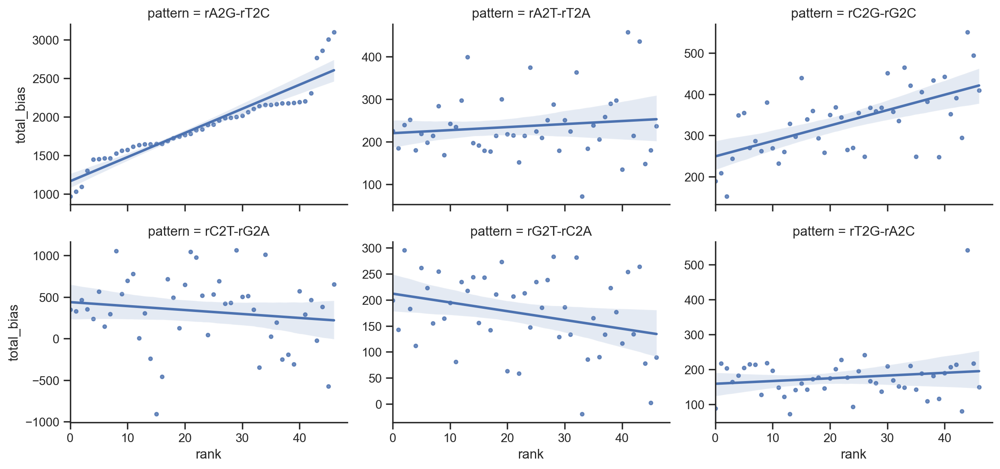

In [16]:
plot_df = (pd.pivot_table(integrated_bias,
           index=['species', 'species_code'], columns='pattern', values='total_bias')
           .sort_values('rA2G-rT2C')
           .reset_index()
           .reset_index()
           .rename(columns={'index':'rank'})
           .melt(id_vars=['rank', 'species', 'species_code'], value_name='total_bias')
          )

with sns.axes_style('ticks'):
    # sorting by pattern 
    g = sns.FacetGrid(plot_df,
                      col='pattern',
                      col_wrap=3, sharey=False, sharex=True, aspect=1.4)
    g = g.map(sns.regplot, 'rank', 'total_bias', lowess=False, scatter_kws={'s':10})
    plt.xlim(left=0)
#    g.map(plt.axhline, y=0, linestyle='dashed', color='black')
    plt.savefig(figures_path / 'ranked_total_sbias_each_paired_rate.pdf')                                                        

That seems to be more or less the case, although there is a lot of noise because of the small signal for the other patterns. The only other one that seems to show a significant slope is `rC2G-G2C`. 

## Integrated bias and GC*

In [ ]:
df = gc_star_ratios.pivot(index='species', columns='variable', values='ratio')
plot_df = (pd.pivot_table(integrated_bias,
           index=['species', 'species_code'], columns='pattern', values='total_bias')
           .merge(df, on='species')
          )
plot_df.head()

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(15, 4))
sns.regplot(x="rA2G-rT2C", y='GCstar', data=plot_df, ax=ax[0])
sns.regplot(x="rA2G-rT2C", y='GCstar_TS', data=plot_df, ax=ax[1])
sns.regplot(x="rA2G-rT2C", y='GCstar_TV', data=plot_df, ax=ax[2])
plt.tight_layout()
plt.savefig(figures_path / 'GCstar_vs_AG_TC_diff_regression.pdf')                                                        

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(15, 4))
sns.regplot(x="rC2G-rG2C", y='GCstar', data=plot_df, ax=ax[0])
sns.regplot(x="rC2G-rG2C", y='GCstar_TS', data=plot_df, ax=ax[1])
sns.regplot(x="rC2G-rG2C", y='GCstar_TV', data=plot_df, ax=ax[2])
plt.tight_layout()
plt.savefig(figures_path / 'CGstar_vs_CG_GC_diff_regression.pdf')                                                        

In [ ]:
plot_df = (pd.pivot_table(integrated_bias,
           index=['species', 'species_code', 'hotspot_center'], columns='pattern', values='total_bias')
           .sort_values('rA2G-rT2C')
           .reset_index()
          )
plot_df

In [ ]:
# plot_df = (pd.pivot_table(integrated_bias.loc[integrated_bias.species_code == 'TAEGU'],
#            index=['hotspot_center'], columns='pattern', values='total_bias')
#            .sort_values('rA2G-rT2C')
#            .reset_index()
# #           .melt(id_vars=['hotspot_center'], value_name='total_bias')
#           )
# plot_df

In [ ]:
sns.lmplot(data=plot_df, x='rA2G-rT2C', y='rT2G-rA2C', col='species_code', col_wrap=8)

In [ ]:
plt.scatter(plot_df['rA2G-rT2C'], plot_df['rT2G-rA2C'])

In [ ]:
from string import ascii_letters
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(style="white")

# Generate a large random dataset
rs = np.random.RandomState(33)
d = pd.DataFrame(data=rs.normal(size=(100, 26)),
                 columns=list(ascii_letters[26:]))

# Compute the correlation matrix
corr = d.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}) ;

# Bias in base composition for comparison

In [ ]:
#hotspot_anno_dist = pd.read_hdf('../results/hotspot_anno_dist.h5')

In [ ]:
hotspot_data.head()

In [ ]:
df = (hotspot_data
      .loc[hotspot_data.bin.abs() <= 40000, 
           ['species', 'species_code', 'bin', 'nC', 'nT', 'nG', 'nA', 'hotspot_center']]
      .merge(hotspot_anno_dist[['hotspot_center', 'dist_cgi']], 
             on='hotspot_center')
      .loc[lambda df: (df.dist_cgi == 0) | (df.dist_cgi.abs() > 40000)]
      .assign(cgi_overlapping=lambda df: df.dist_cgi==0)
      .loc[:, ['species', 'species_code', 'bin', 'nC', 'nT', 'nG', 'nA', 'cgi_overlapping']]
     )
df['C-G'] = (df.nC-df.nG) / (df.nC + df.nG)
df['T-A'] = (df.nT-df.nA) / (df.nT + df.nA)
comp_data = df.melt(id_vars=['species', 'species_code', 'bin', 'cgi_overlapping'], value_vars=['C-G', 'T-A']).sort_values(by=['species', 'bin', 'variable'])
comp_data.head()

In [ ]:
#comp_data[['species', 'species_code']].drop_duplicates().sort_values('species')

In [ ]:
plot_df = (comp_data
           .groupby(['species', 'species_code', 'bin', 'variable'])
           .apply(lambda df: np.nanmean(df.value))
           .to_frame('value')
           .reset_index()
           .sort_values(by=['species', 'bin', 'variable'])
          )


In [ ]:
#groups.apply(lambda df: np.nanmean(df.value)).to_frame('value').reset_index().head()

# I have no idea why I need to do it this way and why the below version does not work

In [ ]:

species = 'TAEGU'
with sns.axes_style('ticks'):
    sns.lineplot(x='bin', y='value', hue='variable', errorbar=None, 
                 data=plot_df.loc[plot_df.species_code==species])
    plt.title(species)
    plt.legend(#bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., 
               frameon=False)
    sns.despine()
    plt.axvline(x=0, linestyle='dashed')

How many hotspots overlap a CGI and how many are at least 40kb away from one:

In [ ]:
comp_data.cgi_overlapping.value_counts()

In [ ]:
3629998 / (3629998 + 11424290)

In [ ]:
species = 'TAEGU'
with sns.axes_style('ticks'):
    sns.lineplot(x='bin', y='value', hue='variable', errorbar=None, 
                 data=comp_data.loc[(comp_data.species_code==species) & (comp_data.cgi_overlapping)])
    plt.title(species)
    plt.legend(#bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., 
               frameon=False)
    sns.despine()
    plt.axvline(x=0, linestyle='dashed')

In [ ]:
species = 'TAEGU'
with sns.axes_style('ticks'):
    sns.lineplot(x='bin', y='value', hue='variable', errorbar=None, 
                 data=comp_data.loc[(comp_data.species_code==species) & (~comp_data.cgi_overlapping)])
    plt.title(species)
    plt.legend(#bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., 
               frameon=False)
    sns.despine()
    plt.axvline(x=0, linestyle='dashed')

In [ ]:
with sns.color_palette("Paired"):
    g = sns.FacetGrid(data=comp_data.loc[comp_data.cgi_overlapfping],
                      col='species', hue='variable',
                      col_wrap=6, sharey=True)
    g = g.map(sns.lineplot, 'bin', 'value', errorbar=None).add_legend()

In [ ]:
with sns.color_palette("Paired"):
    g = sns.FacetGrid(data=comp_data.loc[~comp_data.cgi_overlapping],
                      col='species', hue='variable',
                      col_wrap=6, sharey=True)
    g = g.map(sns.lineplot, 'bin', 'value', errorbar=None).add_legend()

In [ ]:
comp_data.loc[~comp_data.cgi_overlapping].head()

In [ ]:
sns.lineplot(data=comp_data.loc[comp_data.cgi_overlapping], x='bin', y='value', hue='variable') ;

In [ ]:
sns.lineplot(data=comp_data.loc[~comp_data.cgi_overlapping], x='bin', y='value', hue='variable') ;

----

In [ ]:
df = hotspot_data.loc[hotspot_data.bin.abs() <= 40000, ['species', 'species_code', 'bin', 'nC', 'nT', 'nG', 'nA']]
df['C-G'] = (df.nC-df.nG) / (df.nC + df.nG)
df['T-A'] = (df.nT-df.nA) / (df.nT + df.nA)
comp_data = df.melt(id_vars=['species', 'species_code', 'bin'], value_vars=['C-G', 'T-A'])

In [ ]:
species = 'TAEGU'
with sns.axes_style('ticks'):
    sns.lineplot(x='bin', y='value', hue='variable', errorbar=None, data=comp_data.loc[comp_data.species_code==species])
    plt.title(species)
    plt.legend(#bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., 
               frameon=False)
    sns.despine()
    plt.axvline(x=0, linestyle='dashed')
    plt.savefig(figures_path / 'origin_CG_TA_content_zebra_finch.pdf')                                                        

Same plot for each species:

In [ ]:
with sns.color_palette("Paired"):
    g = sns.FacetGrid(comp_data,
                      col='species', hue='variable',
                      col_wrap=6, sharey=True)
    g = g.map(sns.lineplot, 'bin', 'value', errorbar=None).add_legend()
    plt.savefig(figures_path / 'origin_CvsG_and_TvsA_content_indiv_species.pdf')                                                            

The bias in base composition is very similar across species, reflecting that most of bias accumulated in the ancestor to all birds.

In [ ]:
comp_table = pd.pivot_table(comp_data, index=['species', 'species_code', 'bin'], columns='variable', values='value').reset_index()
comp_table['(T-A)-(C-G)'] = comp_table['T-A'] - comp_table['C-G']

In [ ]:
species = ['TAEGU', 'PICPU', 'STRCA']
plot_df = comp_table.loc[comp_table.species_code.isin(species)].copy()
# plot_df.species.cat.remove_unused_categories(inplace=True)
plot_df['species'] = plot_df.species.cat.remove_unused_categories()

with sns.axes_style('ticks'):
    sns.lineplot(x='bin', y='(T-A)-(C-G)', hue='species', errorbar=None, data=plot_df)
    sns.despine()
#    plt.axvline(x=0, linestyle='dashed')
    plt.legend(#bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., 
               frameon=False)
    plt.savefig(figures_path / 'sjump_CG_TA_content_woodpecker_ostrich_zebrafinch.pdf')                                                            

Same plot for each species:

In [ ]:
g = sns.FacetGrid(comp_table,
                  col='species', 
                  col_wrap=8, sharey=True)
g = g.map(sns.lineplot, 'bin', '(T-A)-(C-G)', errorbar=None).add_legend()
plt.savefig(figures_path / 'sjump_CG_TA_content_indiv_species.pdf')                                                        